# MOLECULE GENERATOR

In [1]:
from mlchem.chem.manipulation import (create_molecule,
                                      MolGenerator,
                                      MolCleaner,
                                      PatternRecognition,
                                      smarts_from_string)
from mlchem.chem.visualise.drawing import MolDrawer
import pandas as pd
import numpy as np

## Create a set of alcohols

In [11]:
from rdkit.Chem import AllChem
from rdkit.Chem import MolFromSmarts, MolToSmiles
m = MolFromSmarts('[#6][OX2H]')
smi = MolToSmiles(m)
smi

'C[OH]'

In [2]:
generator = MolGenerator()
generator.generate_smiles(template_string='[#6][OX2H]',
                          n_molecules=300,
                          n_fragments=10,
                          n_substitutions=10,
                          attempt_limit=10000,
                          include_extremities=True)

# Quick kekulisation and neutralisation.
# More in the Molecule Cleaning example notebook

cleaner = MolCleaner(generator.smiles_generated)
cleaner.initialise_smiles()
cleaner.neutralise_smiles()
generator.smiles_generated = cleaner.smiles

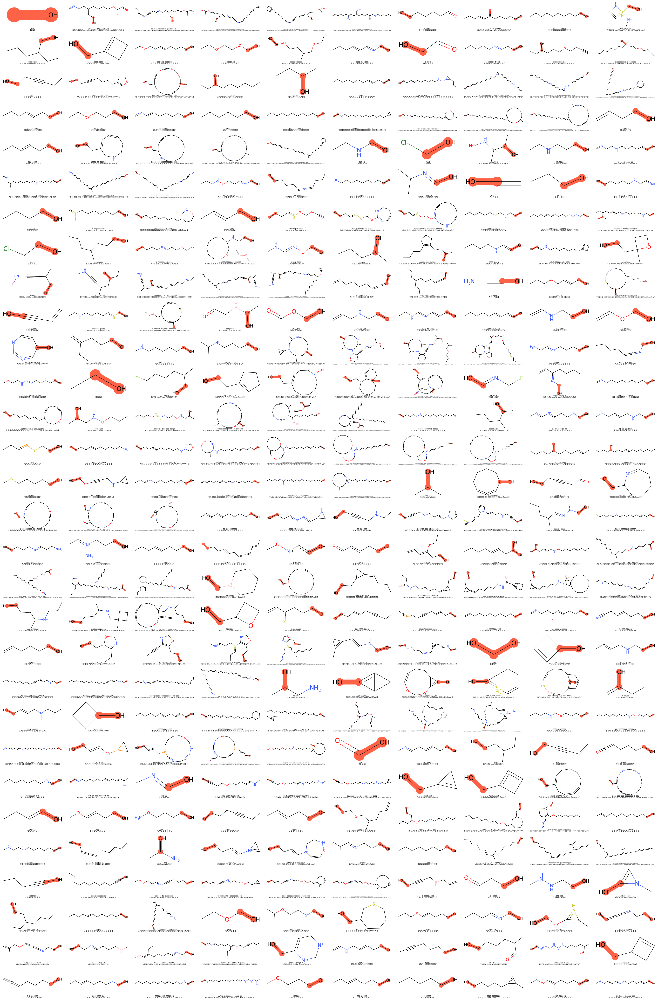

In [3]:
drawer = MolDrawer(size=(400,200))
drawer.update_drawing_options(legendFontSize=25)
pattern_atoms = [PatternRecognition.Base.check_smarts_pattern(target,generator.template_smarts)[1] for target in generator.smiles_generated]
images = [drawer.draw_mol(create_molecule(m),legend=l,highlightAtoms=a) for m,l,a in zip(generator.smiles_generated,generator.double_legend,pattern_atoms)]
drawer.legend_list = generator.double_legend
drawer.show_images_grid(images,10)

In [4]:
data_1 = pd.DataFrame()
data_1['SMILES'] = generator.smiles_generated
data_1['CLASS'] = list(np.int32(np.zeros(len(generator.smiles_generated))))
data_1

,SMILES,CLASS
0,CO,0
1,C=NCCC(CCO)CCCCOC(=O)C=O,0
2,CCC=C=NC#CCC=NCCC(CCO)CCCCOC(=O)C=O,0
3,C#CCCCCOCCC=C=NC#CCC=NCCC(CCO)CCCCOC(=O)C=O,0
4,O=CC(=O)OCCCCC(CCO)CCN=CCC#CN=C=CCCOCCCCC1=CCC...,0
...,...,...
295,CCC=CCCCO,0
296,CCCCCO,0
297,CC1C=C1CCCCCO,0
298,CCOC=CCCCCO,0


## Create a set of random chemicals

In [6]:
generator = MolGenerator()
generator.generate_smiles(template_string='C',
                          n_molecules=300,
                          n_fragments=20,
                          n_substitutions=3,
                          attempt_limit=10000,
                          include_extremities=True)

# Quick kekulisation and neutralisation.
# More in the Molecule Cleaning example notebook

cleaner = MolCleaner(generator.smiles_generated)
cleaner.initialise_smiles()
cleaner.neutralise_smiles()
generator.smiles_generated = cleaner.smiles

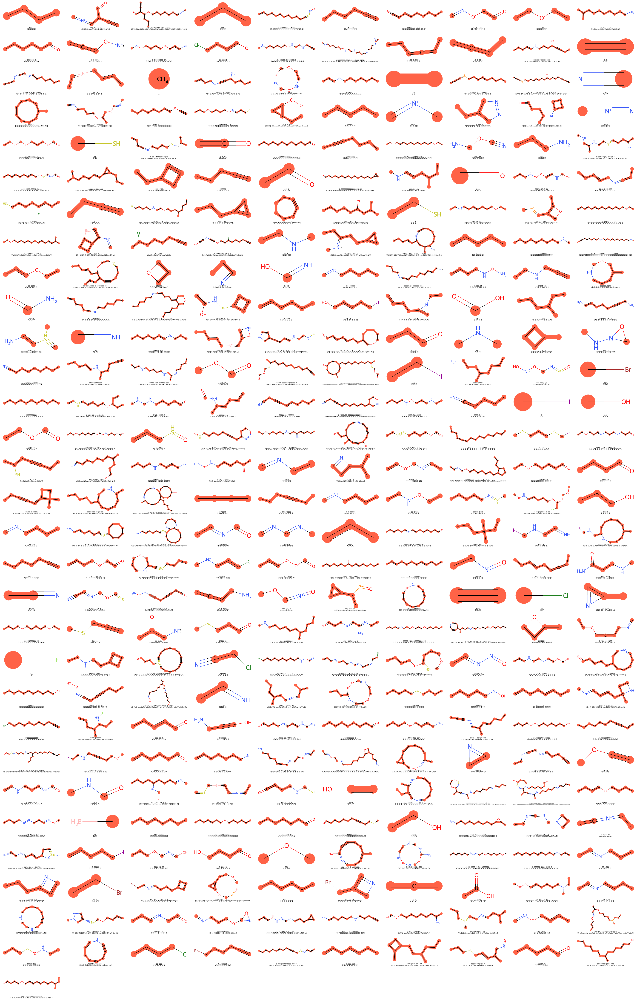

In [7]:
drawer = MolDrawer(size=(400,200))
drawer.update_drawing_options(legendFontSize=25)
pattern_atoms = [PatternRecognition.Base.check_smarts_pattern(target,generator.template_smarts)[1] for target in generator.smiles_generated]
images = [drawer.draw_mol(create_molecule(m),legend=l,highlightAtoms=a) for m,l,a in zip(generator.smiles_generated,generator.double_legend,pattern_atoms)]
drawer.legend_list = generator.double_legend
drawer.show_images_grid(images,10)

In [8]:
data_2 = pd.DataFrame()
data_2['SMILES'] = generator.smiles_generated
data_2['CLASS'] = list(np.int32(np.ones(len(generator.smiles_generated))))
data_2

,SMILES,CLASS
0,CCCC,1
1,C#CC(C=O)C=[N+]=C,1
2,C#CC(C=O)C(CCC)OCCCCCCC=[N+]=C,1
3,CCC,1
4,C=CCCCCCCCCCC#SN=O,1
...,...,...
296,CCCC(C)CCC1=C(C)C=C1,1
297,CCCSCC=CC(C)CN=O,1
298,CCCCC=O,1
299,CCCC=CCCC(C)CCCC=CCO,1


# Save data

In [9]:
data = pd.concat([data_1,data_2],axis=0)
data

,SMILES,CLASS
0,CO,0
1,C=NCCC(CCO)CCCCOC(=O)C=O,0
2,CCC=C=NC#CCC=NCCC(CCO)CCCCOC(=O)C=O,0
3,C#CCCCCOCCC=C=NC#CCC=NCCC(CCO)CCCCOC(=O)C=O,0
4,O=CC(=O)OCCCCC(CCO)CCN=CCC#CN=C=CCCOCCCCC1=CCC...,0
...,...,...
296,CCCC(C)CCC1=C(C)C=C1,1
297,CCCSCC=CC(C)CN=O,1
298,CCCCC=O,1
299,CCCC=CCCC(C)CCCC=CCO,1


In [10]:
data.drop_duplicates('SMILES',inplace=True)
data.to_csv('../data/data.csv',index=None)